## Identify overlapping genes between extTADA (FDR < 0.3) and other gene sets

Here, we use a gene set (n = lGene) identified by the extTADA methods (FDR < 0.3).


### We choose some other gene sets:

For each gene set which includes N genes, there are main steps to calculate significant value:

1. Count the number of genes overlapping between the *lGene* genes and the gene set, nG.

2. For i from 1 to K (times)

    - Randomly choose a set of N genes from all genes (>20000 genes).
    
    - Count the number of genes overlapping between the *lGene* genes and the random gene set, $M_i$.
    
3. Calculate p value for the gene set, using the formula:

*pValue = (length(vM[vM >= nG]) + 1)/(K + 1) *



with $vM = c(M_1, M_2, ..M_K)$

Wilcoxon test is also used to test the difference between a gene set and other genes in ~ 20000 genes.

### Gene sets in this analysis


Antipsychotics-combined

108 loci from schizophrenia study

Results from DAWN package

Primary and secondary

Autism study of Lossifov2014

Schizophrenia Gene Resource (http://bioinfo.mc.vanderbilt.edu/SZGR/index.jsp) 

In [1]:
xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
xResult <- readLines("../data/List.309genes.FDR03.from.scz2016.txt.sort")
xResult <- readLines("../data/FDR_scz2016_Singleon_noexac.txt.sort.03")


p value: 0.0508589828203436


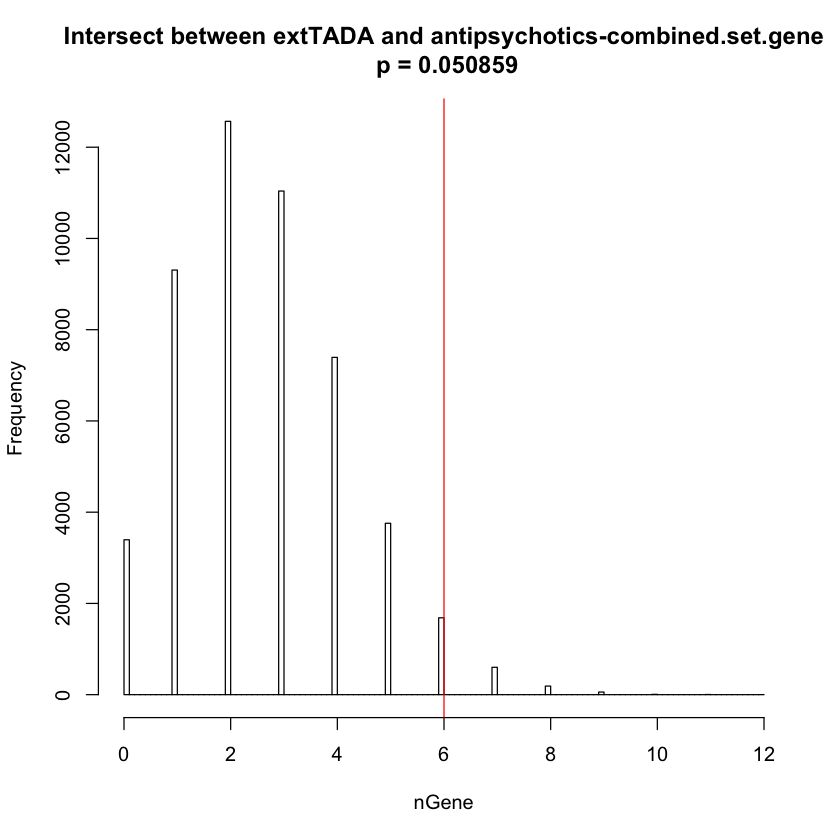

In [4]:

x1 <- readLines("../data/genelists/antipsychotics-combined.set.gene")
#x1 <- readLines("../data/GENETICS-2016-187195v1-Lin_geneSet.onlyGene.sort")
#x1 <- readLines("../data/prot.genes")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

xFMRP <- x1
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)

    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))

for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)

pV <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
message("p value: ", pV)

    hist(outList, 100, main = paste("Intersect between extTADA and antipsychotics-combined.set.gene",
                                    "\n p = ", round(pV, 6), sep = ""), 
                                    xlim = range(c(outList, xIntersect + 1)), xlab = 'nGene')
    abline(v = xIntersect, col = 'red')
    



## List Genes from 108 loci

In [8]:
x1 <- readLines("../data/genelists/list.proteinCodingGenes.from108.txt.sort")
#x1 <- readLines("../data/antipsychotics-combined.set.gene")

p value: 0.27537449251015


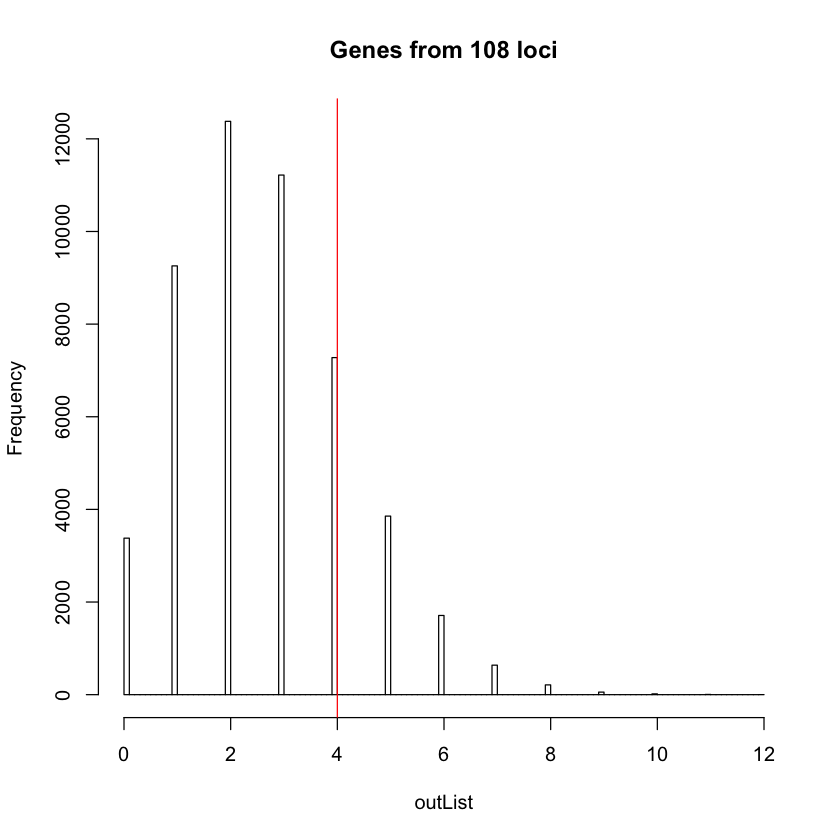

In [9]:
pList <- NULL
nG <- NULL
lGeneSet <- NULL

xFMRP <- x1
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)

    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))

for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)

message("p value: ", (1 + length(outList[outList >= xIntersect]))/(nSample + 1))

    hist(outList, 100, main = "Genes from 108 loci", xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red', xlab = 'nGene')
    



,Gene,qvalue
1,SYNGAP1,0.04192883
2,TAF13,0.04668544
3,ABLIM2,0.04847277
4,ABCC10,0.05112653
5,HSPA8,0.06119167
6,ZNF451,0.0708627


x1,xIndex
ABCB9,5029
ACD,18018
ACTR5,15632
ADAMTSL3,17157
AGPHD1,6294
AKT3,1567


,Gene,qvalue,list108
1,SYNGAP1,0.04192883,0
2,TAF13,0.04668544,0
3,ABLIM2,0.04847277,0
4,ABCC10,0.05112653,0
5,HSPA8,0.06119167,0
6,ZNF451,0.0708627,0



Call:
glm(formula = list108 ~ qvalue, data = sAll)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-0.01931  -0.01773  -0.01757  -0.01747   0.98262  

Coefficients:
             Estimate Std. Error t value Pr(>|t|)   
(Intercept)  0.019420   0.006730   2.886  0.00391 **
qvalue      -0.002571   0.009648  -0.267  0.78985   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for gaussian family taken to be 0.01733501)

    Null deviance: 329.09  on 18985  degrees of freedom
Residual deviance: 329.09  on 18984  degrees of freedom
AIC: -23105

Number of Fisher Scoring iterations: 2



	Wilcoxon rank sum test with continuity correction

data:  qvalue by as.factor(list108)
W = 3005200, p-value = 0.2319
alternative hypothesis: true location shift is not equal to 0


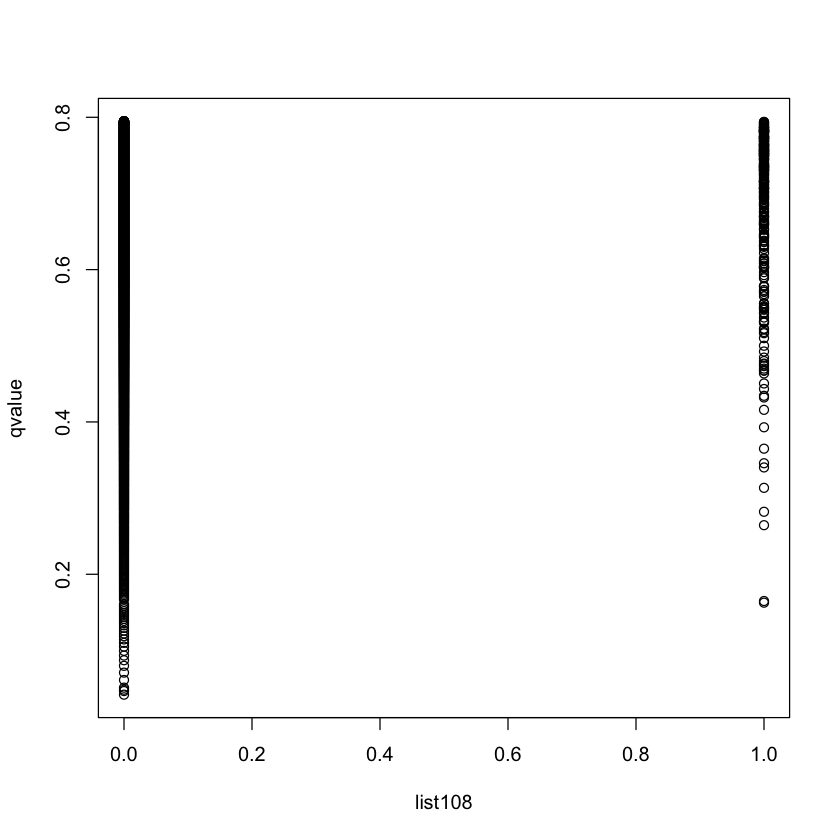

In [10]:
allGeneList <- read.table("List.Allgenes.from.scz2016.txt", header = TRUE)
allGeneList <- read.table("../data/FDR_scz2016_Singleon_noexac.txt", header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
head(sAll)
sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(x1, sAll$Gene)
xT <- cbind(x1, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

head(xT)
sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])
head(sAll)

x.glm <- glm(list108 ~ qvalue, data = sAll)
plot(qvalue ~ list108, data = sAll)
summary(x.glm)

wilcox.test(qvalue ~ as.factor(list108), data = sAll)

## Autism results

In [11]:
aData <- read.table("TADA/data/TADA_results.csv", header = TRUE, sep = ",")
head(aData)

,Gene,mut.rate,dn.LoF,case.LoF,ctrl.LoF,trans.LoF,ntrans.LoF,dn.mis3,case.mis3,ctrl.mis3,trans.mis3,ntrans.mis3,BF,pval.TADA,qvalue
1,SCN2A,7.4e-05,4,2,0,0,0,5,4,26,5,5,1596280319,2.668802e-07,9.814483e-09
2,SYNGAP1,6.55e-05,6,0,0,0,0,1,3,6,4,2,127675315,2.668802e-07,6.626078e-08
3,CHD8,9.25e-05,3,4,0,0,0,2,7,29,4,2,484952.8,2.668802e-07,1.081234e-05
4,ARID1B,9.02e-05,4,0,0,0,0,1,5,35,5,8,162474.6,2.668802e-07,3.221326e-05
5,ANK2,0.00014923,3,3,4,2,0,2,24,89,21,17,83588.24,2.668802e-07,6.324892e-05
6,SUV420H1,3.48e-05,3,0,0,0,0,2,1,5,0,1,80659.67,2.668802e-07,8.50731e-05


[1] 107

p value: 0.00919981600367993


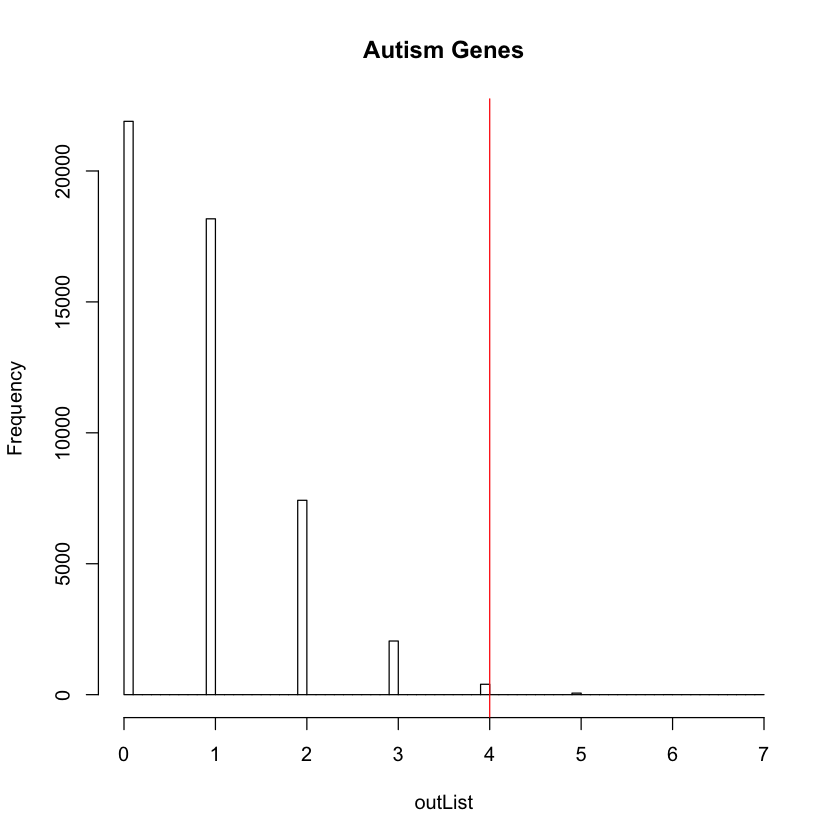

In [12]:

x1 <- aData[aData$qvalue < 0.3, 1]
x1 <- x1[!is.na(x1)]
length(x1)
pList <- NULL
nG <- NULL
lGeneSet <- NULL

xFMRP <- x1
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)

    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))

for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)

message("p value: ", (1 + length(outList[outList >= xIntersect]))/(nSample + 1))

    hist(outList, 100, main = "Autism Genes", xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    

#bAA <- merge(allGeneList, aData)

#head(bAA, 2)


## Gene results from DAWN

p value: 0.0448591028179436


,Gene,Gene.Ensembl,Sherlock.pValue,DAWN.FDR,Cluster.Label,mut_lof,mut_missense,dn_damaging,dn_lof,control_damaging,ellip.h,case_discruptive_Singleton_broad_noexac,control_discruptive_Singleton_broad_noexac,case_damaging_Singleton_broad_noexac,control_damaging_Singleton_broad_noexac,case_missense_Singleton_broad_noexac,control_missense_Singleton_broad_noexac,case_deleterious_Singleton_broad_noexac,control_deleterious_Singleton_broad_noexac,BF,qvalue
1,ABCC8,ENSG00000006071,0.00361581,0.04463151,NA,4.127919e-06,5.639537e-05,0,0,16,⋯,1,3,2,2,16,11,3,5,0.8483221,0.6123957
2,ABHD4,ENSG00000100439,0.0371186,0.0889243,2,1.255231e-06,1.212137e-05,0,0,4,⋯,1,0,1,1,4,2,2,1,0.9339022,0.5969082
3,ABL2,ENSG00000143322,0.0265501,0.02117349,2,3.05065e-06,3.432762e-05,0,0,3,⋯,1,0,1,2,13,15,2,2,0.4624309,0.7305146
4,ACACB,ENSG00000076555,0.0272723,0.07059385,1,6.33098e-06,8.986255e-05,0,0,50,⋯,2,1,7,11,20,27,9,12,0.1920626,0.7831819
5,ACADVL,ENSG00000072778,0.00130124,0.003016885,2,1.768932e-06,2.488217e-05,0,0,11,⋯,1,1,0,1,2,9,1,2,0.1550829,0.7880156
6,ACHE,ENSG00000087085,0.0295283,0.0009006908,1,1.60267e-06,2.807624e-05,0,0,8,⋯,1,0,3,0,8,6,4,0,1.3789,0.4939419


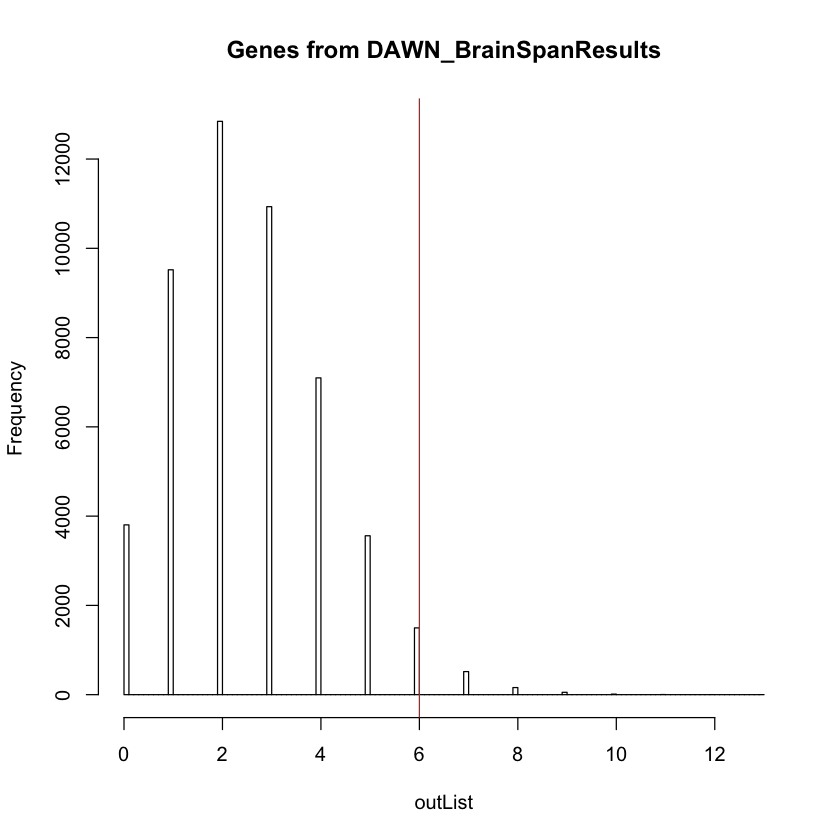

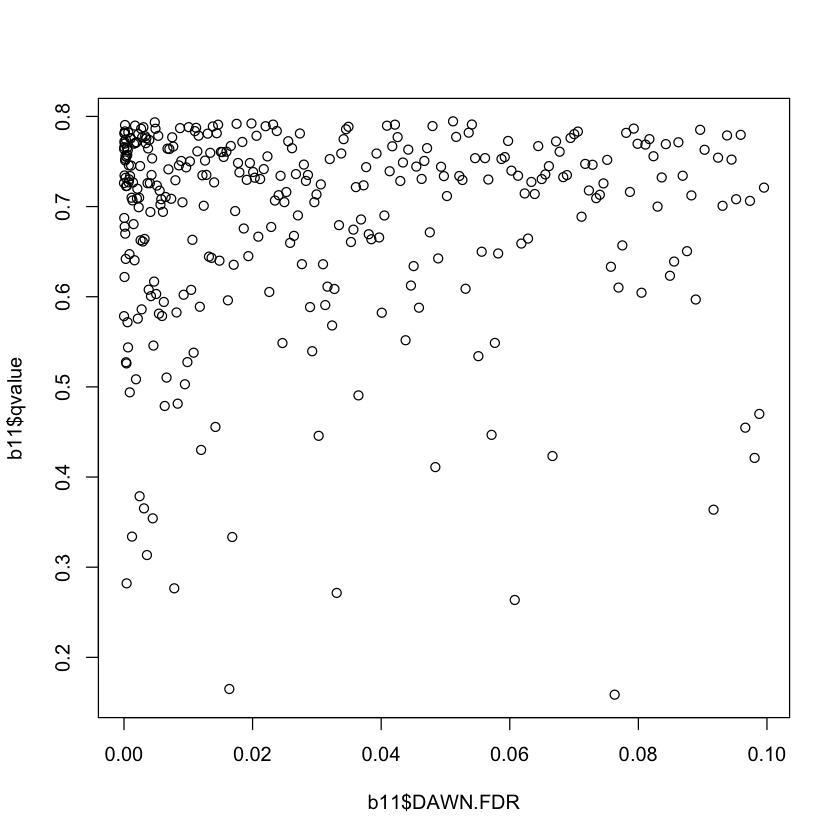

In [13]:
aa <- read.table("../../DataSetFromCMU_DAWN_method/DAWN_Results/BrainSpanResults.txt", header = TRUE)

#x1 <- readLines("../data/rbfox13.txt")
x1 <- aa$Gene.Name
x1 <- x1[!is.na(x1)]
pList <- NULL
nG <- NULL
lGeneSet <- NULL

xFMRP <- x1
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)

    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))

for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)

message("p value: ", (1 + length(outList[outList >= xIntersect]))/(nSample + 1))

    hist(outList, 100, main = "Genes from DAWN_BrainSpanResults", xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
colnames(aa)[2] <- "Gene"

b11 <- merge(aa, allGeneList)
head(b11)

plot(b11$DAWN.FDR, b11$qvalue)

p value: 0.482170356592868


,Gene,Gene.Ensembl,Sherlock.pValue,DAWN.FDR,Cluster.Label,mut_lof,mut_missense,dn_damaging,dn_lof,control_damaging,ellip.h,case_discruptive_Singleton_broad_noexac,control_discruptive_Singleton_broad_noexac,case_damaging_Singleton_broad_noexac,control_damaging_Singleton_broad_noexac,case_missense_Singleton_broad_noexac,control_missense_Singleton_broad_noexac,case_deleterious_Singleton_broad_noexac,control_deleterious_Singleton_broad_noexac,BF,qvalue
1,ABCB8,ENSG00000197150,0.0192014,0.005412841,6,1.749752e-06,2.931186e-05,0,0,7,⋯,0,3,1,0,3,8,1,3,0.1405803,0.7894108
2,ABCC8,ENSG00000006071,0.00361581,3.977161e-05,4,4.127919e-06,5.639537e-05,0,0,16,⋯,1,3,2,2,16,11,3,5,0.8483221,0.6123957
3,ABL2,ENSG00000143322,0.0265501,0.01818083,2,3.05065e-06,3.432762e-05,0,0,3,⋯,1,0,1,2,13,15,2,2,0.4624309,0.7305146
4,ABRACL,ENSG00000146386,0.00539769,0.01898089,2,2.712263e-07,2.354928e-06,0,0,0,⋯,0,0,0,0,0,0,0,0,0.6318133,0.6709385
5,ABT1,ENSG00000146109,0.00129229,0.02625983,1,3.909523e-07,1.399626e-05,0,0,4,⋯,0,1,0,2,0,5,0,3,0.1846355,0.7841235
6,ACAP3,ENSG00000131584,0.0550594,0.01099582,1,2.086612e-06,3.836402e-05,0,0,5,⋯,2,1,4,2,9,9,6,3,0.6442528,0.6666806


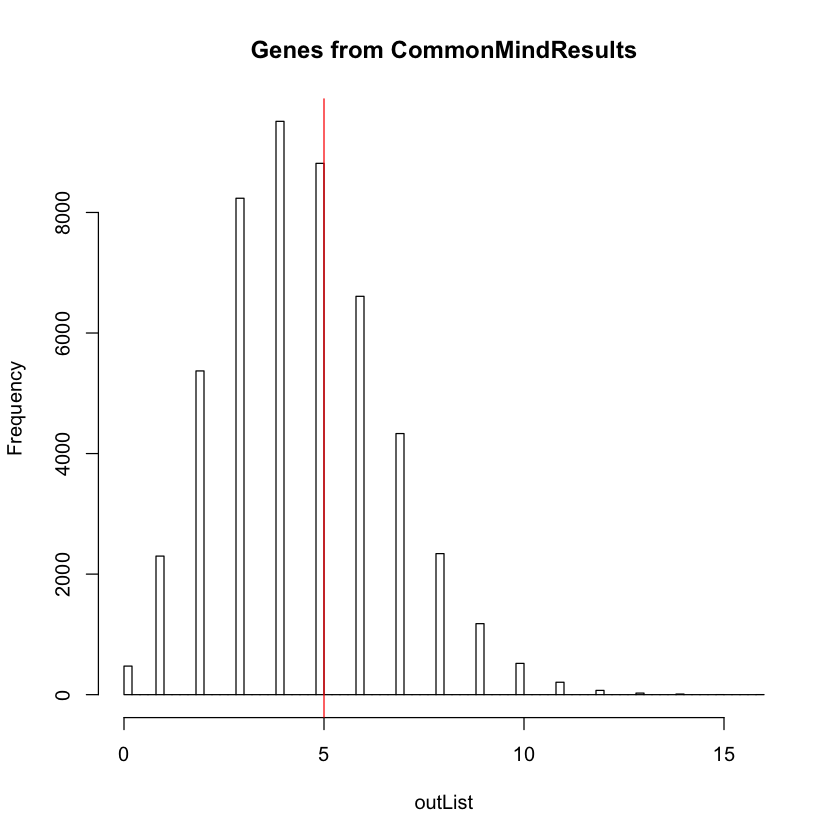

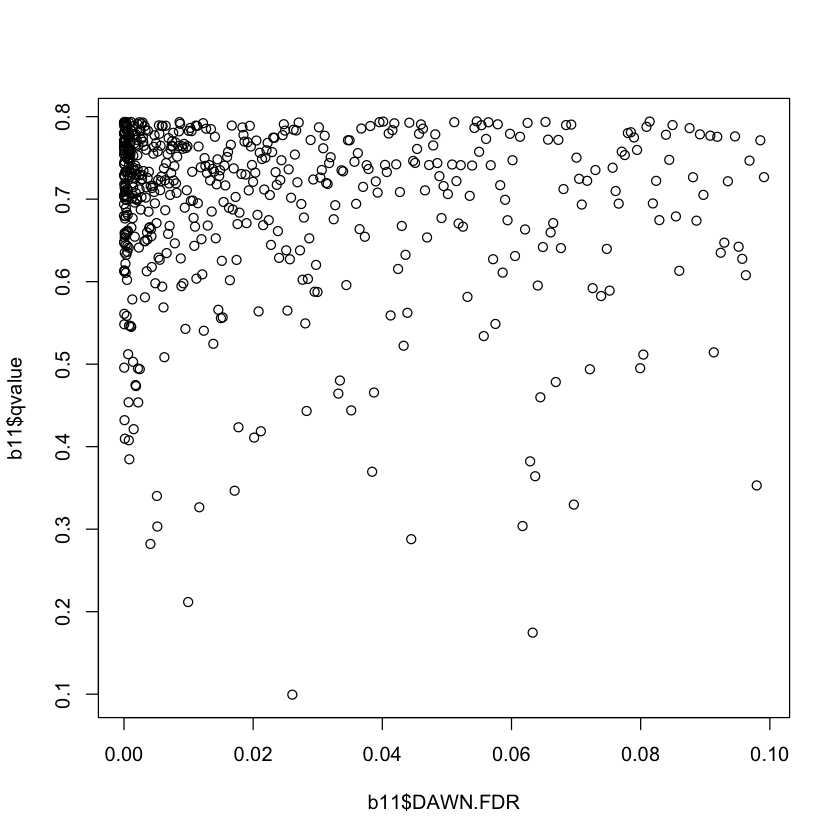

In [14]:
aa <- read.table("../../DataSetFromCMU_DAWN_method/DAWN_Results/CommonMindResults.txt", header = TRUE)

#x1 <- readLines("../data/rbfox13.txt")
x1 <- aa$Gene.Name
x1 <- x1[!is.na(x1)]
pList <- NULL
nG <- NULL
lGeneSet <- NULL

xFMRP <- x1
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)

    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))

for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)

message("p value: ", (1 + length(outList[outList >= xIntersect]))/(nSample + 1))

    hist(outList, 100, main = "Genes from CommonMindResults", xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
colnames(aa)[2] <- "Gene"

b11 <- merge(aa, allGeneList)
head(b11)

plot(b11$DAWN.FDR, b11$qvalue)

## New gene sets from Giulio

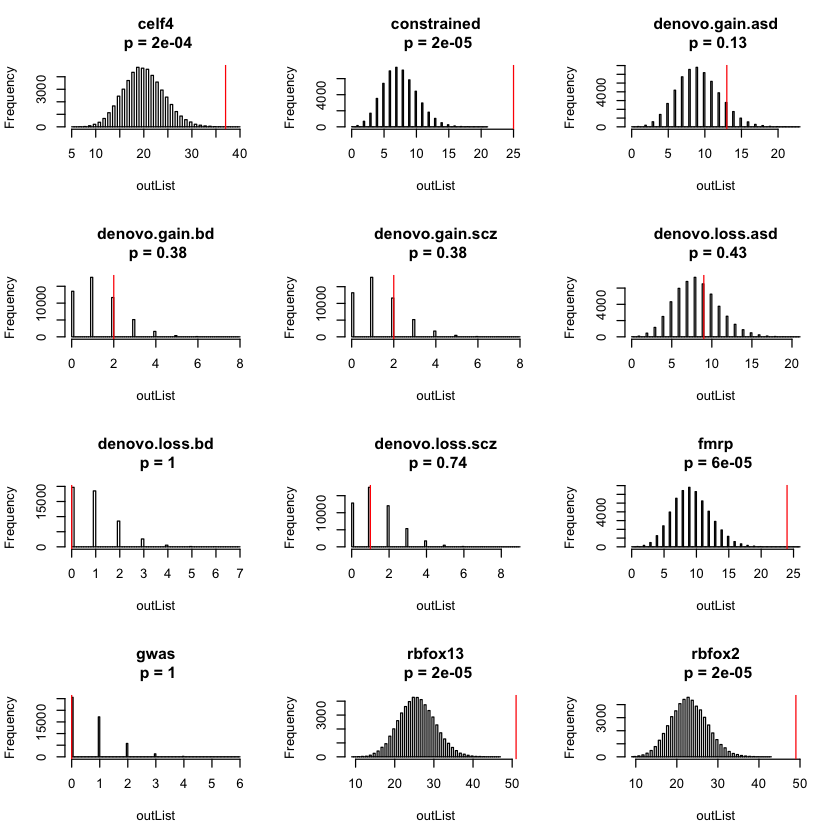

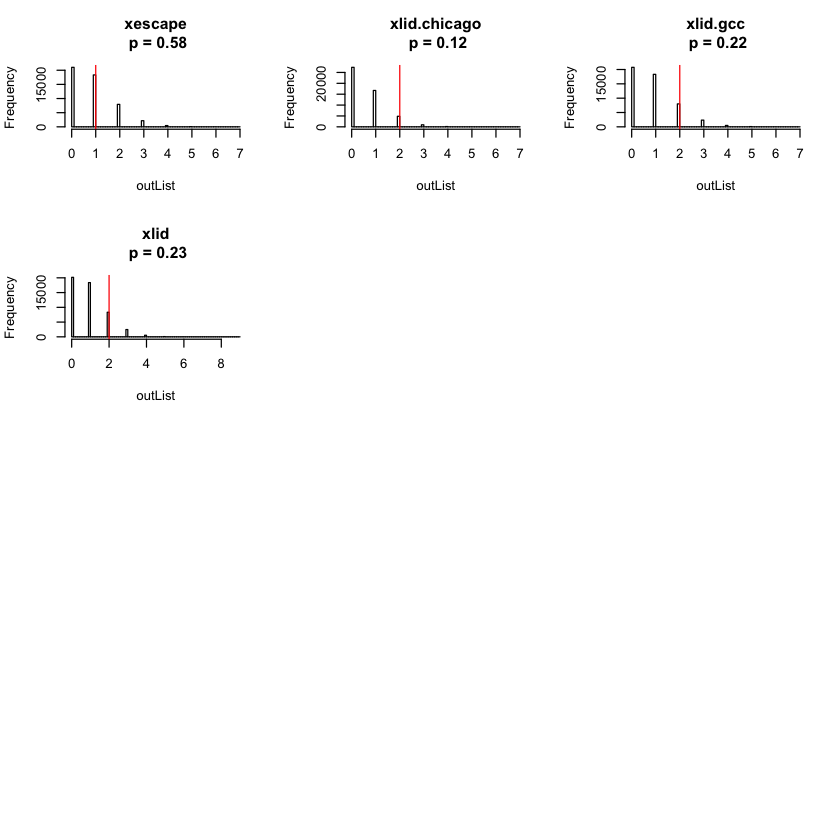

In [18]:
fileN <- c("celf4.txt", 
"constrained.txt", 
"denovo.gain.asd.txt", 
"denovo.gain.bd.txt", 
"denovo.gain.scz.txt", 
"denovo.loss.asd.txt", 
"denovo.loss.bd.txt", 
"denovo.loss.scz.txt", 
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
"xescape.txt", 
"xlid.chicago.txt", 
"xlid.gcc.txt", 
"xlid.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL

par(mfrow = c(4, 3))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]), "\n p = ", signif(pList[kk], 2), sep = ""), 
         xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
    #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
}


In [19]:
outD <- cbind(fileN, pList, nG, lGeneSet, pAllFDR)
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 5] <- signif(as.numeric(outD[, 5]), 2)

colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "pValueAllFDR")
outD[order(as.numeric(outD[, 2])),]

gene_set_name,pValue,nOverlappingGene,GeneSetLength,pValueAllFDR
constrained.txt,2e-05,25,983,0.055
rbfox13.txt,2e-05,51,3380,0.00061
rbfox2.txt,2e-05,49,3022,2e-04
fmrp.txt,6e-05,24,1215,2.3e-13
celf4.txt,2e-04,37,2630,4.6e-05
xlid.chicago.txt,0.12,2,77,0.085
denovo.gain.asd.txt,0.13,13,1195,0.58
xlid.gcc.txt,0.22,2,114,0.17
xlid.txt,0.23,2,118,0.31
denovo.gain.bd.txt,0.38,2,169,0.98


### Test for all FDRs with gene sets

,Gene,qvalue
1,SYNGAP1,0.04192883
2,TAF13,0.04668544
3,ABLIM2,0.04847277
4,ABCC10,0.05112653
5,HSPA8,0.06119167
6,ZNF451,0.0708627


,V1,xIndex


,Gene,qvalue,list108
1,SYNGAP1,0.04192883,0
2,TAF13,0.04668544,0
3,ABLIM2,0.04847277,0
4,ABCC10,0.05112653,0
5,HSPA8,0.06119167,0
6,ZNF451,0.0708627,0



Call:
glm(formula = list108 ~ qvalue, data = sAll)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
     0       0       0       0       0  

Coefficients:
            Estimate Std. Error t value Pr(>|t|)
(Intercept)        0          0      NA       NA
qvalue             0          0      NA       NA

(Dispersion parameter for gaussian family taken to be 0)

    Null deviance: 0  on 18985  degrees of freedom
Residual deviance: 0  on 18984  degrees of freedom
AIC: -Inf

Number of Fisher Scoring iterations: 1


ERROR: Error in wilcox.test.formula(qvalue ~ as.factor(list108), data = sAll): grouping factor must have exactly 2 levels


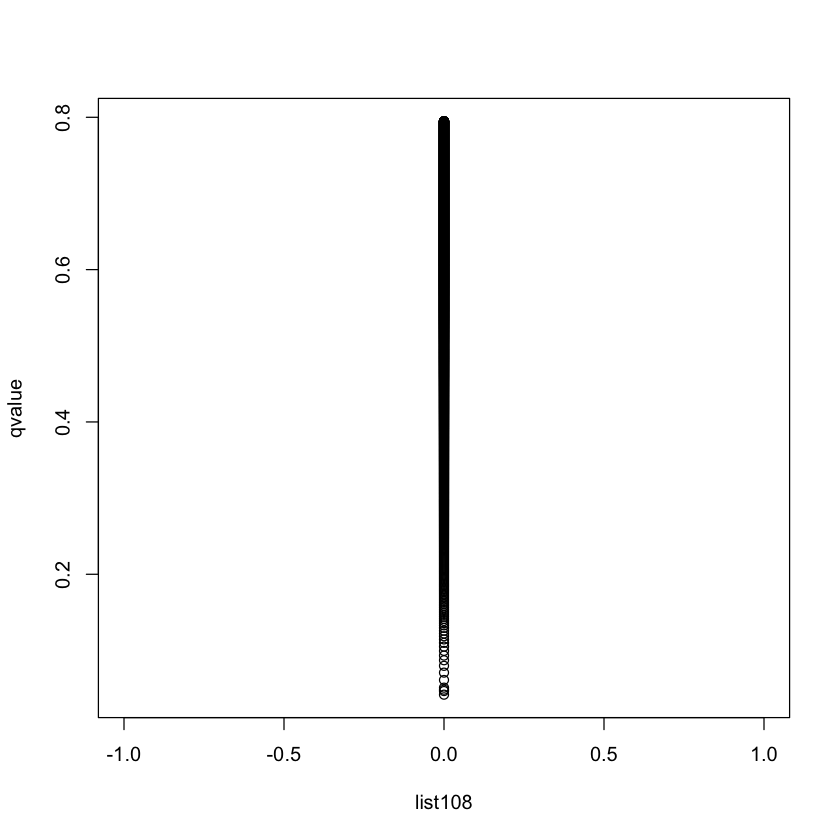

In [20]:
allGeneList <- read.table("List.Allgenes.from.scz2016.txt", header = TRUE)
allGeneList <- read.table("../data/FDR_scz2016_Singleon_noexac.txt", header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]
head(sAll)
sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(x1, sAll$Gene)
xT <- cbind(x1, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

head(xT)
sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])
head(sAll)

x.glm <- glm(list108 ~ qvalue, data = sAll)
plot(qvalue ~ list108, data = sAll)
summary(x.glm)

wilcox.test(qvalue ~ as.factor(list108), data = sAll)

## Purcell Swedex sets

In [21]:
dirF = "../data/genelists/purcell_swedex_sets"

fileN = dir(dirF)
fileN

[1] "cav2.set"                 "collapsed-candidates.set"
[3] "gene-families.set"        "go.fist.2columns"        
[5] "ion.set"                  "primary.set"             
[7] "secondary.set"

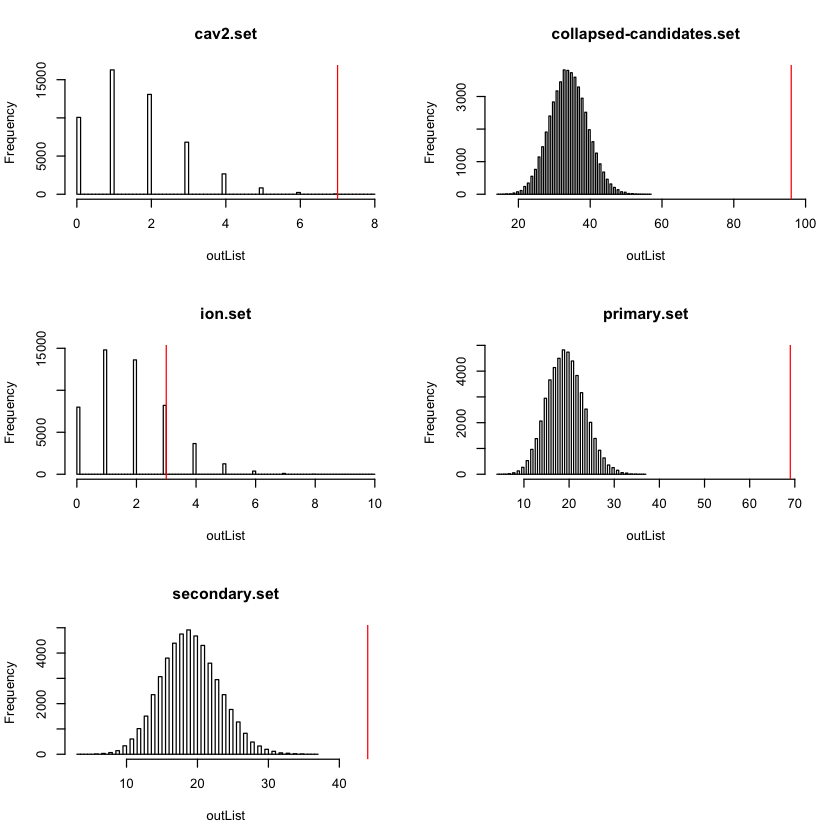

In [22]:
pList <- NULL
nG <- NULL
lGeneSet <- NULL
pAllFDR <- NULL

par(mfrow = c(3, 2))
for (kk in c(1, 2, 5:7)){
x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)

l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 50000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

#    1- pnorm(xIntersect, mean(outList), sd = sd(outList))

    hist(outList, 100, main = fileN[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
       #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
}


In [23]:
outD <- cbind(fileN, pList, nG, lGeneSet, pAllFDR)
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 5] <- signif(as.numeric(outD[, 5]), 2)

colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "pValueAllFDR")
outD[order(as.numeric(outD[, 2])),]

gene_set_name,pValue,nOverlappingGene,GeneSetLength,pValueAllFDR
collapsed-candidates.set,2e-05,96,4465,4.7e-09
primary.set,2e-05,69,2546,2.6e-09
secondary.set,2e-05,44,2507,1.7e-35
cav2.set,9e-04,7,206,0.73
ion.set,0.27,3,237,0.34
gene-families.set,NA,NA,NA,NA
go.fist.2columns,NA,NA,NA,NA


### Based on the table above, the overlapping proportion between *primary.set* and *309 genes* is higher than expected by chance.


### Take a loser look for the primary.set

In [24]:
allFile <- read.table("../data/genelists/purcell_swedex_sets/primary.set")

In [25]:
go1 <- split(allFile, allFile[, 2])

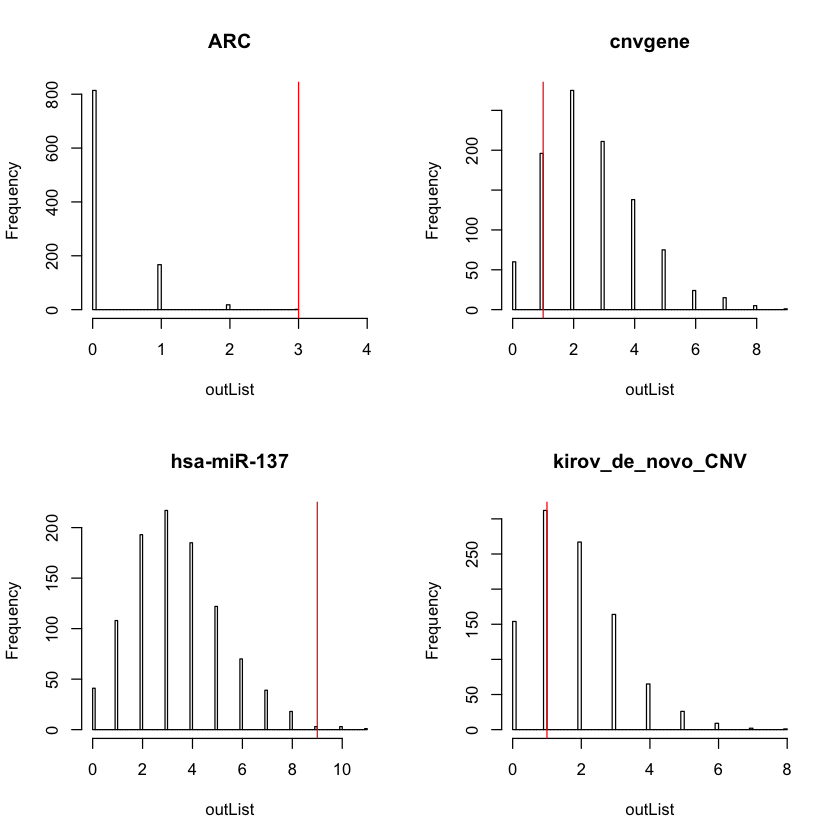

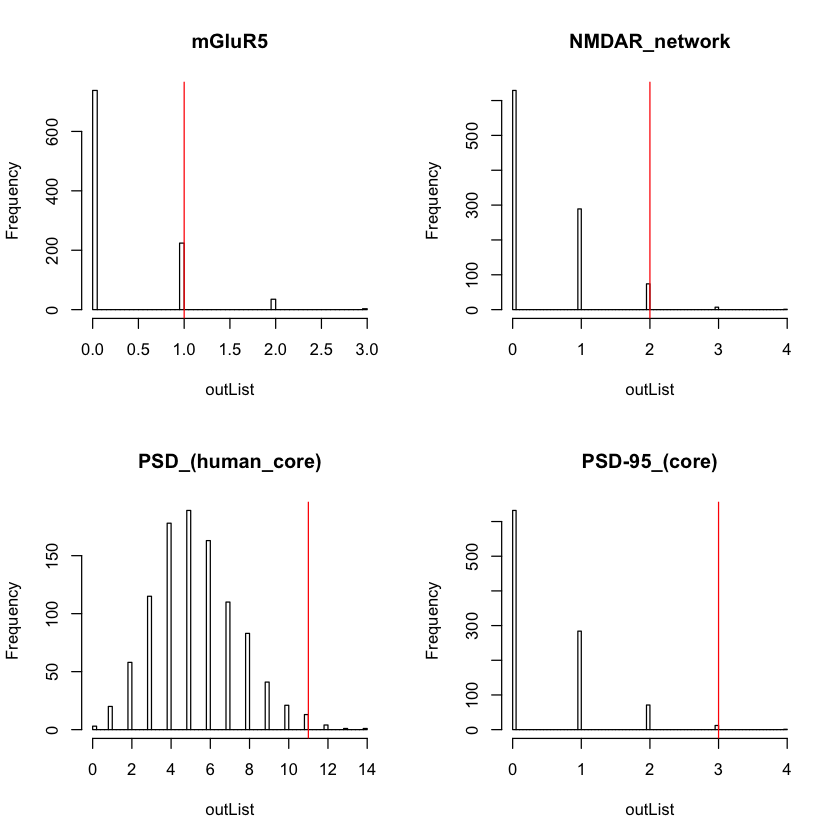

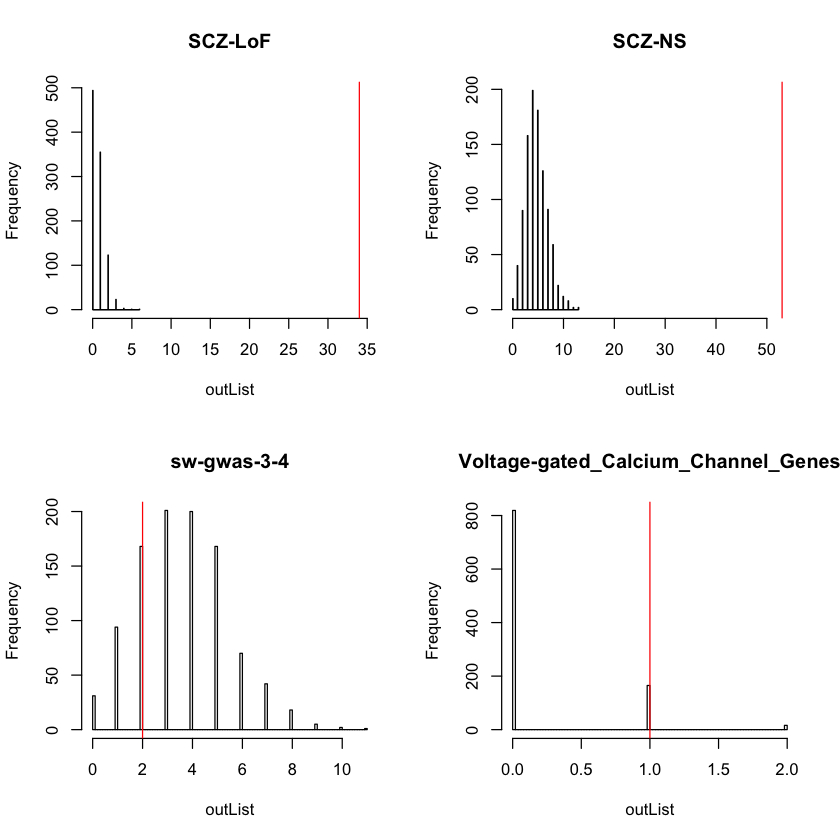

In [26]:
pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL

par(mfrow = c(2, 2))
for (kk in 1:length(go1)){
#  x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
  x1 <- as.character(go1[[kk]][, 1])
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- as.character(go1[[kk]][1, 2])
    
  nSample <- 1000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 +  length(outList[outList >= xIntersect]) )/(nSample + 1)
    
       hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
       #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
}


In [27]:
outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/309, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)
outD[order(outD[, 2]) ,]

pAllFDR

gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
SCZ-LoF,0.001,34,87,11,2.7e-45
SCZ-NS,0.001,53,611,17.15,7.2e-62
ARC,0.002,3,28,0.97,0.068
hsa-miR-137,0.008,9,446,2.91,0.82
PSD-95_(core),0.014,3,65,0.97,0.0042
PSD_(human_core),0.02,11,685,3.56,0.081
NMDAR_network,0.083,2,61,0.65,0.027
Voltage-gated_Calcium_Channel_Genes,0.18,1,26,0.32,0.99
mGluR5,0.26,1,39,0.32,0.11
kirov_de_novo_CNV,0.85,1,234,0.32,0.42


[1] 6.826963e-02 8.887100e-01 8.210573e-01 4.168129e-01 1.128220e-01
 [6] 2.728484e-02 8.149675e-02 4.235031e-03 2.712622e-45 7.217201e-62
[11] 3.933567e-03 9.906153e-01

### The secondary.set

In [28]:
allFile <- read.table("../data/genelists/purcell_swedex_sets/secondary.set")

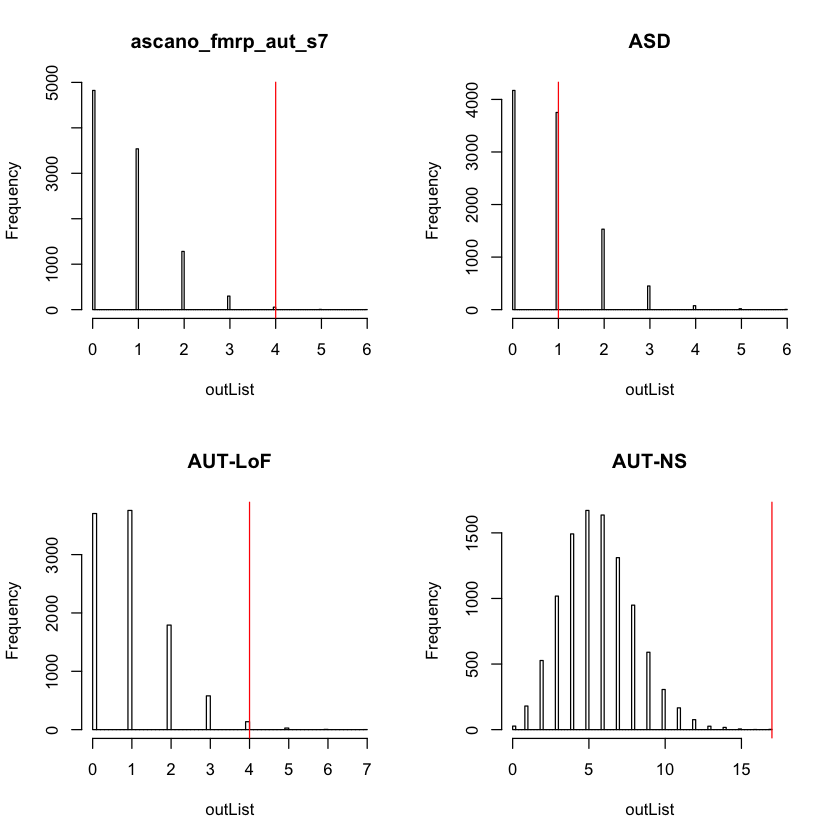

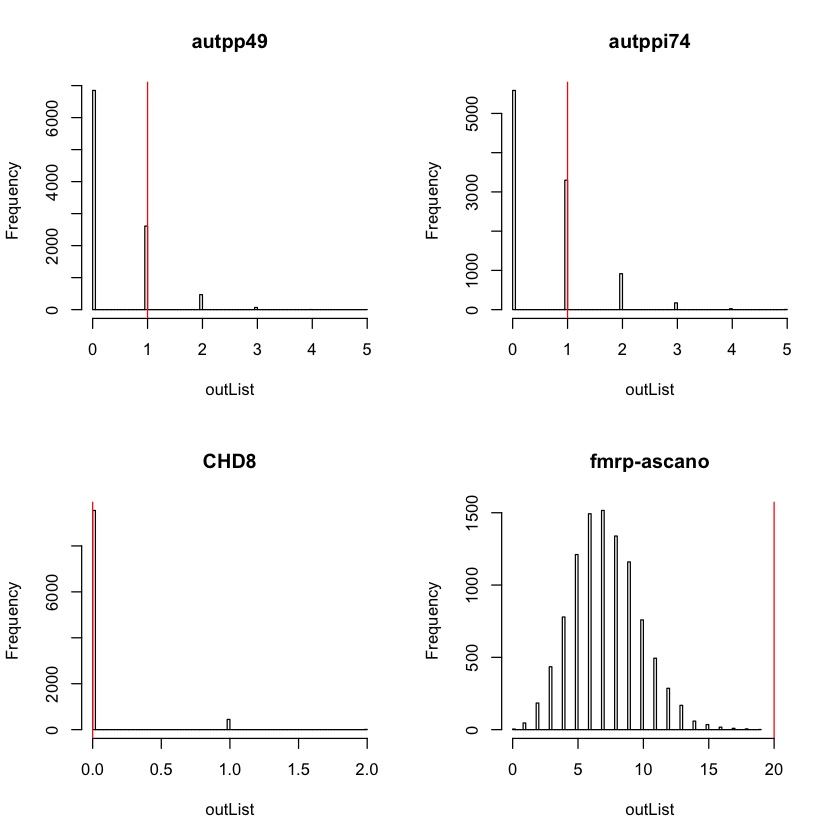

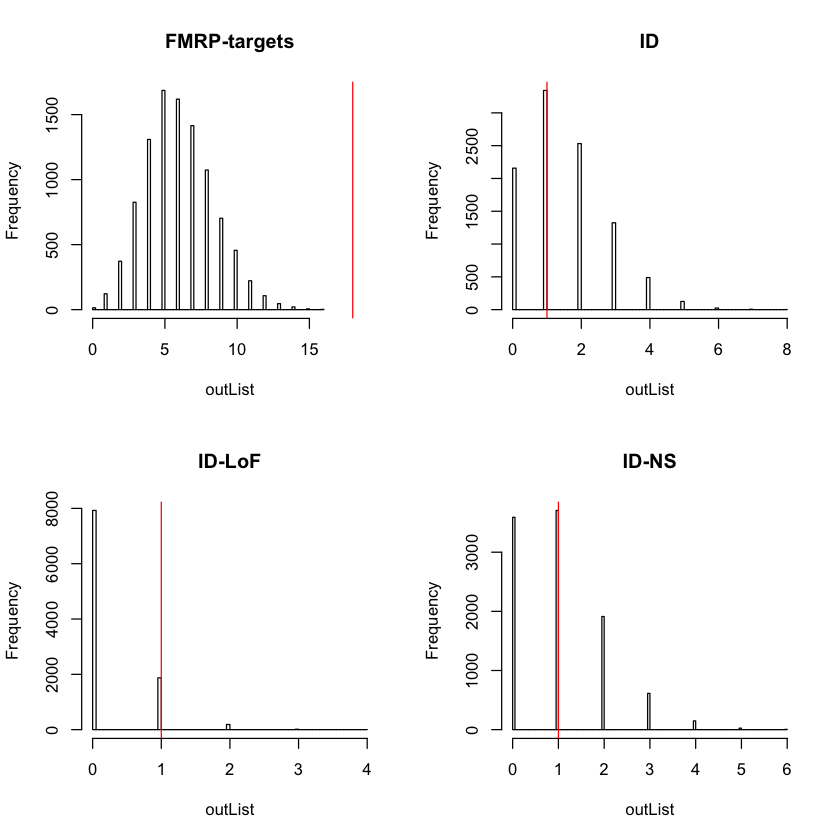

In [29]:
go1 <- split(allFile, allFile[, 2])
pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL

par(mfrow = c(2, 2))
for (kk in 1:length(go1)){
#  x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
  x1 <- as.character(go1[[kk]][, 1])
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- as.character(go1[[kk]][1, 2])
    
  nSample <- 10000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
    
       hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
           #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
  
}


In [30]:
outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/309, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)
outD[order(as.numeric(outD[, 2])) ,]



gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
fmrp-ascano,1e-04,20,939,6.47,4.6e-22
FMRP-targets,1e-04,18,788,5.83,1.7e-09
AUT-NS,3e-04,17,743,5.5,3e-15
ascano_fmrp_aut_s7,0.0061,4,93,1.29,0.11
AUT-LoF,0.017,4,128,1.29,2e-04
ID-LoF,0.21,1,30,0.32,0.98
autpp49,0.32,1,49,0.32,0.06
autppi74,0.44,1,74,0.32,0.014
ASD,0.58,1,112,0.32,0.79
ID-NS,0.64,1,132,0.32,0.16


## The brainspan.set

In [31]:
allFile <- read.table("../data/genelists/brainspan.set")

In [32]:
head(allFile)

,V1,V2
1,A1CF,LOW
2,A2M,HIGH
3,A2M,POST
4,A2ML1,LOW
5,A3GALT2,LOW
6,A4GALT,POST


In [33]:
go1 <- split(allFile, allFile[, 2])

In [34]:
table(allFile[, 2])


  CACN-HIGH    CACN-LOW   CACN-POST    CACN-PRE DENOVO-HIGH  DENOVO-LOW 
         15           7           6           6         387         170 
DENOVO-POST  DENOVO-PRE   FMRP-HIGH    FMRP-LOW   FMRP-POST    FMRP-PRE 
         81         338         706           3         193         359 
       HIGH         LOW    one-HIGH     one-LOW    one-POST     one-PRE 
       9378        6259        1417         165         391         835 
       POST         PRE    PSD-HIGH     PSD-LOW    PSD-POST     PSD-PRE 
       2432        8052         685           6         205         293 

In [35]:
length(go1)
head(go1[[1]])
length(go1)

[1] 24

,V1,V2
31802,CACNA1A,CACN-HIGH
31803,CACNA1B,CACN-HIGH
31804,CACNA1E,CACN-HIGH
31805,CACNA1G,CACN-HIGH
31806,CACNA1H,CACN-HIGH
31807,CACNA2D1,CACN-HIGH


[1] 24

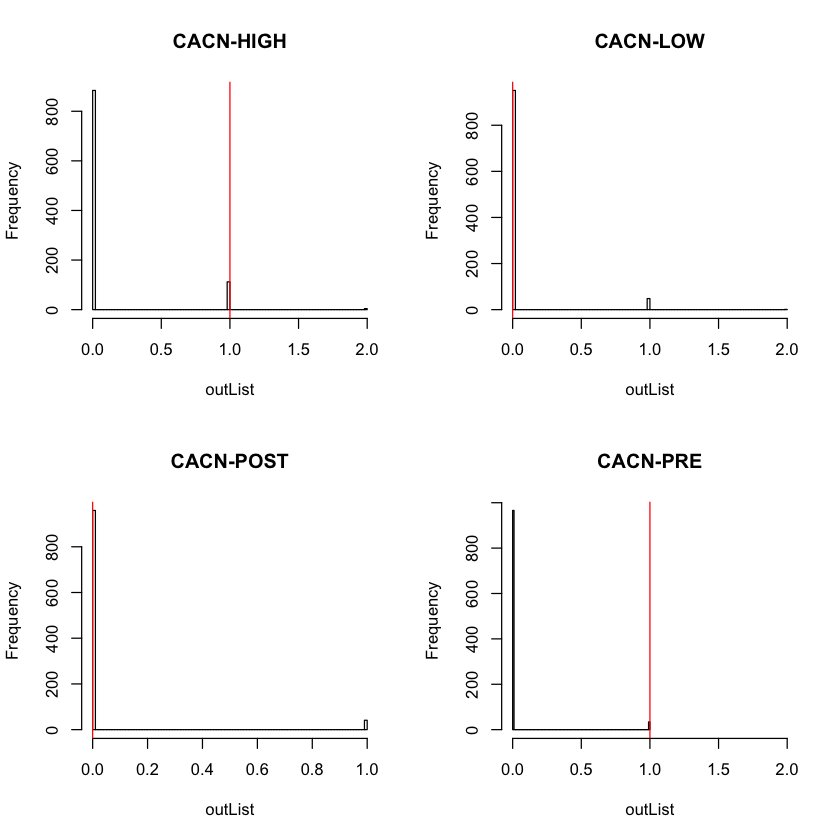

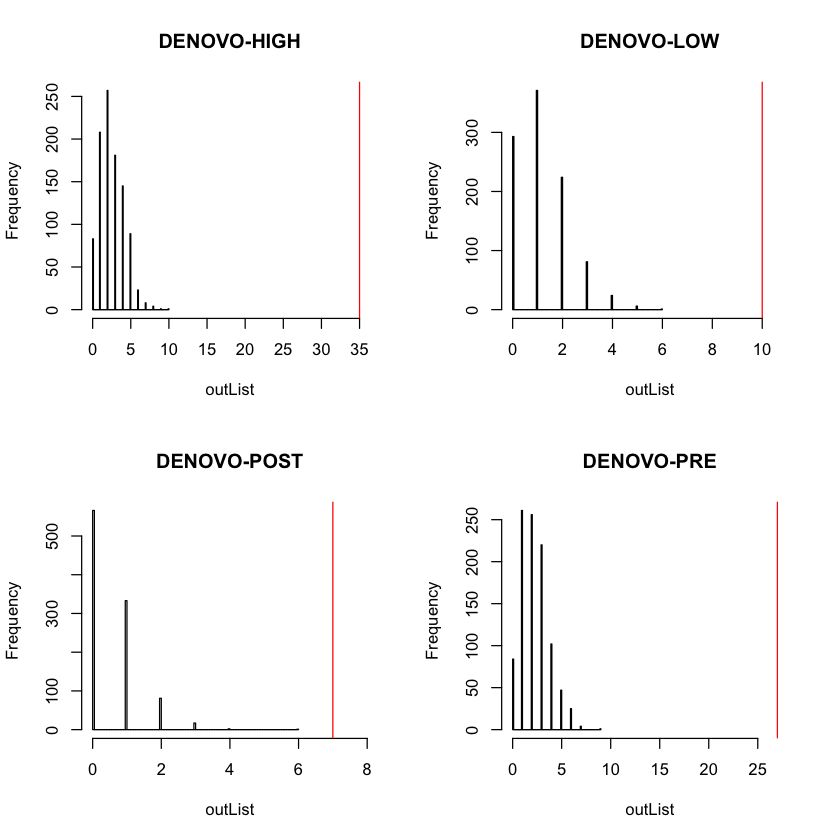

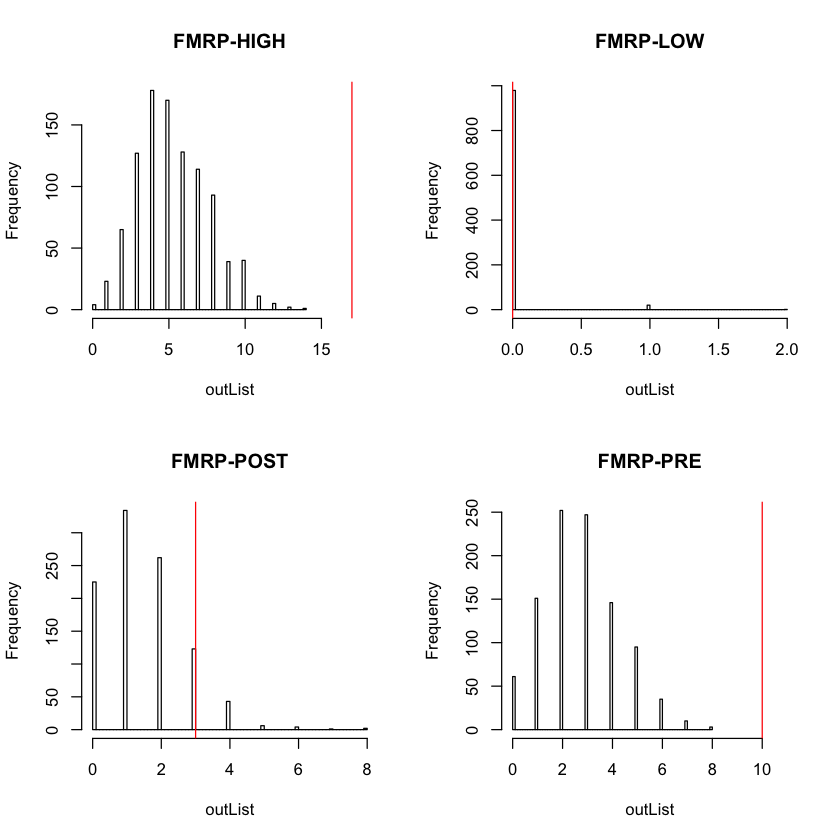

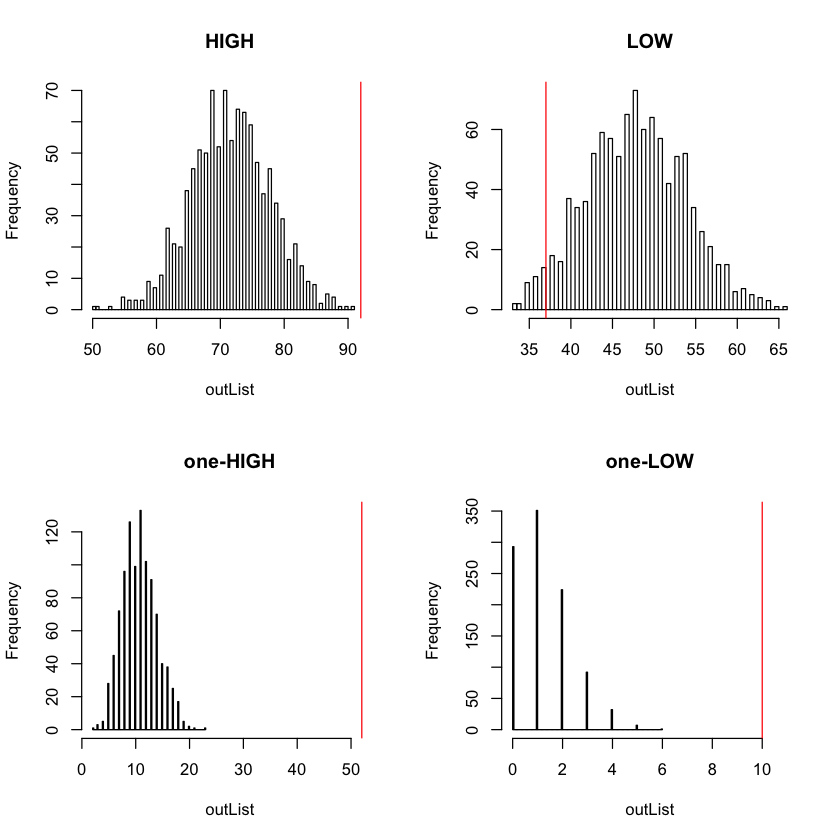

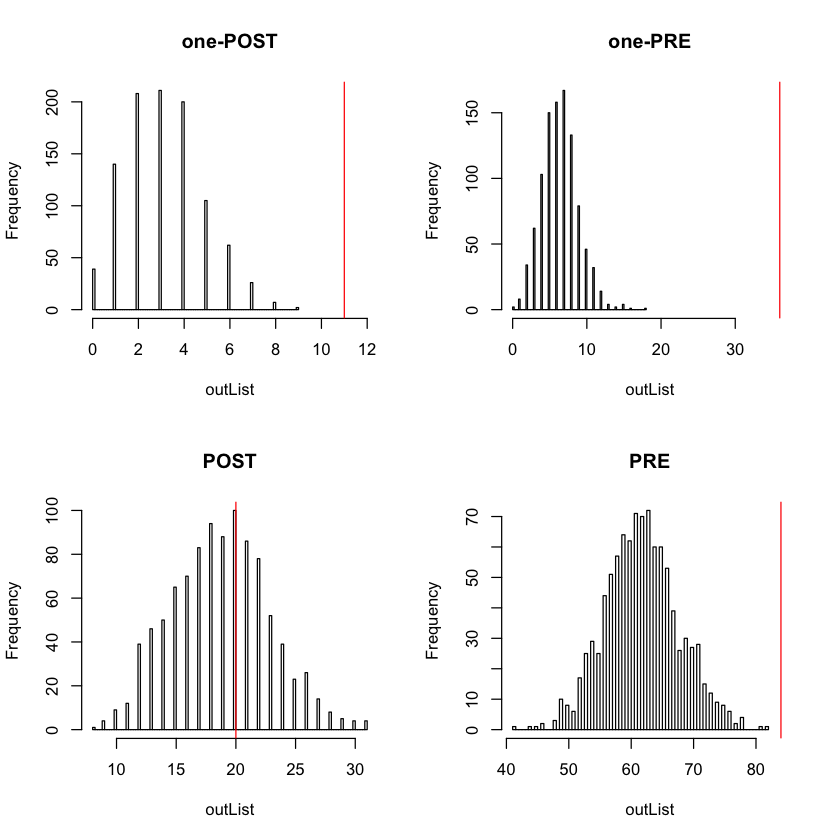

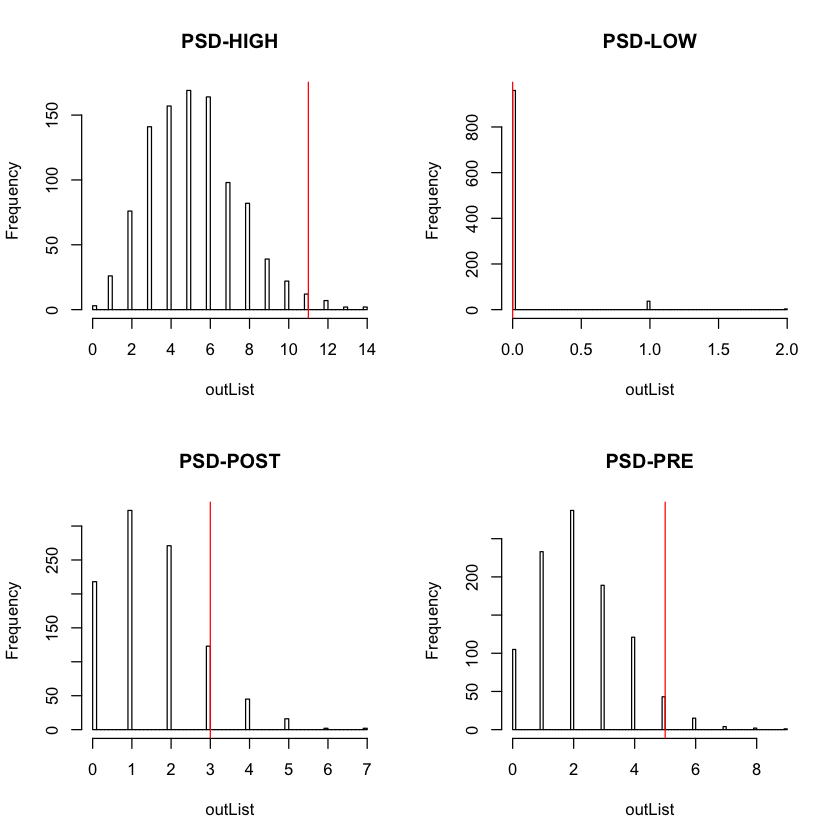

In [36]:
pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL

par(mfrow = c(2, 2))
for (kk in 1:length(go1)){
#  x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
  x1 <- as.character(go1[[kk]][, 1])
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- as.character(go1[[kk]][1, 2])
    
  nSample <- 1000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
    #1- pnorm(xIntersect, mean(outList), sd = sd(outList))
    
       hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
             #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
xT <- cbind(xFMRP, xIndex)
xT <- xT[!is.na(xT[, 2]), ]

sAll[xT[, 2], 3] <- rep(1, dim(xT)[1])

pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
}


In [37]:
outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/309, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)
outD[order(as.numeric(outD[, 2])) ,]



gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
DENOVO-HIGH,0.001,35,335,11.33,8e-42
DENOVO-LOW,0.001,10,152,3.24,2.6e-14
DENOVO-POST,0.001,7,72,2.27,1.6e-07
DENOVO-PRE,0.001,27,295,8.74,7.3e-32
FMRP-HIGH,0.001,17,706,5.5,9.8e-07
FMRP-PRE,0.001,10,359,3.24,3.7e-05
HIGH,0.001,92,9378,29.77,0.72
one-HIGH,0.001,52,1417,16.83,0.32
one-LOW,0.001,10,165,3.24,5.3e-12
one-POST,0.001,11,391,3.56,0.51


#### Conditional on brainspan.set

In [38]:
allFile <- read.table("../data/genelists/brainspan.set")

In [39]:
go1 <- split(allFile, allFile[, 2])

In [40]:
table(allFile[, 2])

dim(allFile)


  CACN-HIGH    CACN-LOW   CACN-POST    CACN-PRE DENOVO-HIGH  DENOVO-LOW 
         15           7           6           6         387         170 
DENOVO-POST  DENOVO-PRE   FMRP-HIGH    FMRP-LOW   FMRP-POST    FMRP-PRE 
         81         338         706           3         193         359 
       HIGH         LOW    one-HIGH     one-LOW    one-POST     one-PRE 
       9378        6259        1417         165         391         835 
       POST         PRE    PSD-HIGH     PSD-LOW    PSD-POST     PSD-PRE 
       2432        8052         685           6         205         293 

[1] 32389     2

In [41]:
head(sAll)

,Gene,qvalue,list108
1,SYNGAP1,0.04192883,0
2,TAF13,0.04668544,0
3,ABLIM2,0.04847277,0
4,ABCC10,0.05112653,0
5,HSPA8,0.06119167,1
6,ZNF451,0.0708627,0


In [42]:
colnames(allFile) <- c("Gene", "BrainspanSet")

s1 <- merge(sAll, allFile)
dim(s1)
head(s1)

[1] 31396     4

,Gene,qvalue,list108,BrainspanSet
1,A1CF,0.7765282,0,LOW
2,A2M,0.7883487,0,HIGH
3,A2M,0.7883487,0,POST
4,A2ML1,0.4940551,0,LOW
5,A3GALT2,0.598734,0,LOW
6,A4GALT,0.7513858,0,POST


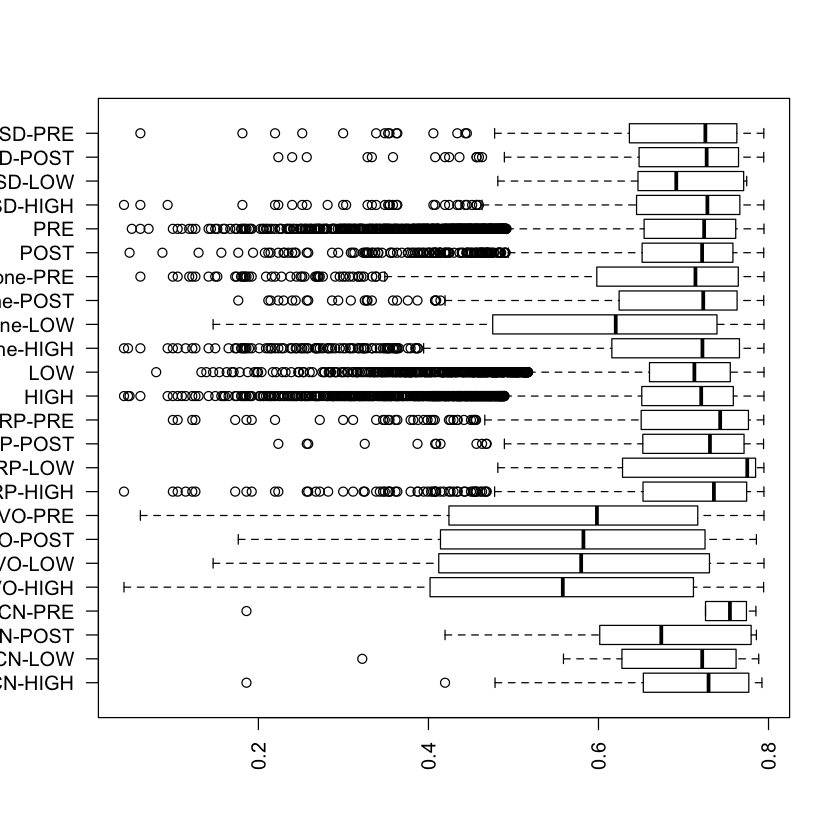

In [43]:
boxplot(qvalue ~ BrainspanSet, data = s1, las = 2        , horizontal = TRUE)

,Gene,qvalue,list108
1,SYNGAP1,0.04192883,0
2,TAF13,0.04668544,0


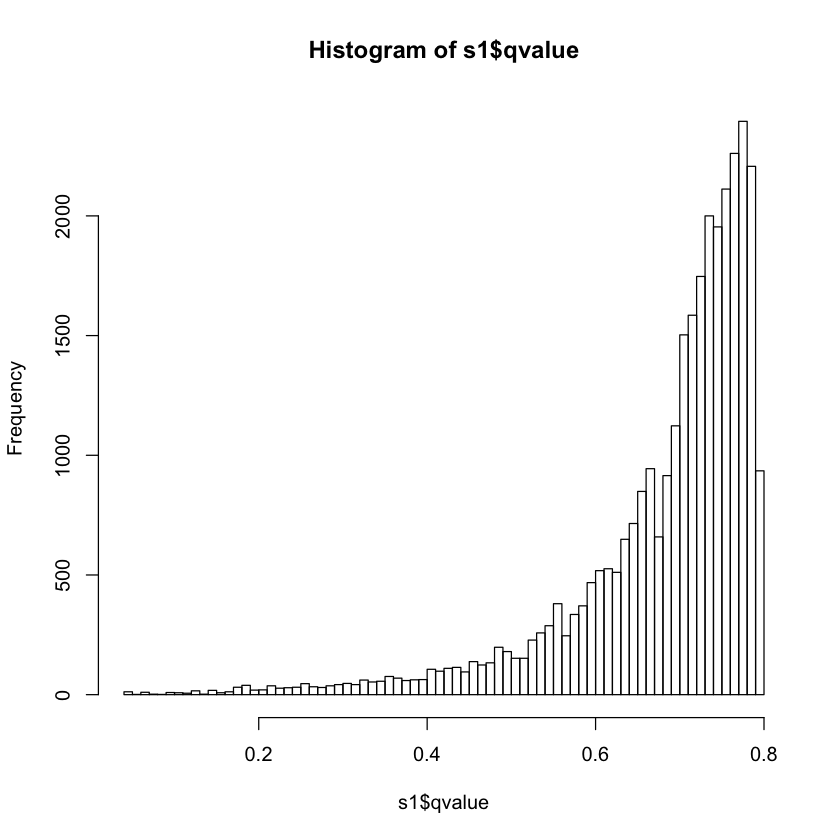

In [44]:
hist(s1$qvalue, 100)
head(sAll, 2)

In [45]:
s01 <- s1[s1$qvalue <= 0.1, ]

sort(table(s01$BrainspanSet))

CACN-HIGH    CACN-LOW   CACN-POST    CACN-PRE  DENOVO-LOW DENOVO-POST 
          0           0           0           0           0           0 
   FMRP-LOW   FMRP-POST     one-LOW    one-POST     PSD-LOW    PSD-POST 
          0           0           0           0           0           0 
   FMRP-PRE         LOW     PSD-PRE  DENOVO-PRE   FMRP-HIGH     one-PRE 
          1           1           1           2           2           2 
       POST    PSD-HIGH         PRE    one-HIGH DENOVO-HIGH        HIGH 
          2           3           4           5           6           6

## TEST GO.SET

In [46]:
allFile <- read.table("../data/genelists/go.set.2columns", sep = " ")

In [47]:
go0 <- split(allFile, allFile[, 2])

In [48]:
c1 <- lapply(go1, function(x) dim(x)[1] )

#lapply(a, Filter, f = function(x) length(x) >= 3)

In [49]:
NN = 10
go1 <- go0[c1 >= NN]
length(go1)

[1] 3004

In [50]:
pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL
par(mfrow = c(2, 2))
for (kk in 1:length(go1)){
#  x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
  x1 <- as.character(go1[[kk]][, 1])
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
    tIndex <- pmatch(xFMRP, xAll)
    tIndex <- tIndex[!is.na(tIndex)]
    xFMRP <- xAll[tIndex]
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- as.character(go1[[kk]][1, 2])
    
  nSample <- 1000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
    #1- pnorm(xIntersect, mean(outList), sd = sd(outList))
    
  #     hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
   # abline(v = xIntersect, col = 'red')
    
             #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
   sAll$list108[xIndex] <- 1

        if (length(table(sAll$list108)) > 1)
            pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
}


In [51]:
x1
xFMRP
pmatch(x1, xAll)
length(xFMRP)
kk
xT

[1] "APOH"      "CTSH"      "CUZD1"     "DHCR24"    "F11"       "F12"      
 [7] "HIST1H2BA" "KLKB1"     "MMP14"     "PLAT"      "PRSS12"    "PRSS3"    
[13] "DMBT1"     "CUZD1"     "DMBT1"     "GNAI1"     "GNAI3"     "KCNQ1"    
[19] "RAB27B"    "RAB3D"     "SRGN"      "TMED10"    "TMED2"     "ZG16"     
[25] "CUZD1"     "DMBT1"     "KCNQ1"     "RAB27B"    "TMED10"    "TMED2"    
[31] "ZG16"

[1] "APOH"      "CTSH"      "CUZD1"     "DHCR24"    "F11"       "F12"      
 [7] "HIST1H2BA" "KLKB1"     "MMP14"     "PLAT"      "PRSS12"    "PRSS3"    
[13] "DMBT1"     "GNAI1"     "GNAI3"     "KCNQ1"     "RAB27B"    "RAB3D"    
[19] "SRGN"      "TMED10"    "TMED2"     "ZG16"

[1]   906  4133  4167  4631  5624  5626  7733  9101 11660 14257 14937 14943
[13]  4755    NA    NA  7014  7016  8781 15276 15295 17784 18770 18772 20730
[25]    NA    NA  8782    NA    NA    NA 20731

[1] 22

[1] 3004

xFMRP,xIndex
FARSB,13627
RALA,6607
EEF1D,1756
FAM49A,3856
CCT8,10605
CCT2,14653
DPYSL3,16777
YWHAQ,5829
CFL1,6481
GNAI2,14351


In [52]:
outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/309, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)

outD <- outD[order(as.numeric(outD[, 2])), ]


In [53]:
dim(outD[outD[, 2] < 0.05, ])

[1] 95  6

In [54]:
outD[outD[, 2] < 0.05, ]

gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
binding,0.001,114,11746,36.89,2.6e-21
biological,0.001,101,9840,32.69,1.6e-08
cell,0.001,138,14682,44.66,9.3e-20
cellular_component,0.001,148,16583,47.9,8.4e-12
intracellular,0.001,122,12563,39.48,5.3e-10
macroautophagy,0.001,4,29,1.29,0.8
membrane-bounded,0.001,98,9605,31.72,2.3e-06
organelle,0.001,106,10567,34.3,1.2e-08
pre-autophagosomal,0.001,3,14,0.97,0.88
response,0.001,50,4069,16.18,0.1


In [55]:
min(outD[, 2])

[1] "0.001"

In [56]:
dim(outD[as.numeric(outD[, 6])/20000 < 0.05, ])

[1] 3004    6

### Gene set from Autism Lossifov2014

In [57]:
fileTemp <- read.table("../data/listGeneSetFromAutismLossifov2014.txt", header = TRUE)
head(fileTemp)

,gene,set_FMRPTargets,set_PSD,set_Embryonic,set_ChromatinModifiers,set_EssentialGenes,set_MendelianDiseaseGenes,set_DeNovoLGDsInSchizoprenia,set_DeNovoLGDsInID
1,CHD8,1,0,0,1,1,0,0,0
2,DYRK1A,0,0,1,0,1,0,0,0
3,ANK2,1,1,0,0,0,0,0,0
4,GRIN2B,1,1,0,0,0,0,0,0
5,DSCAM,1,0,0,0,1,0,0,0
6,CHD2,0,0,0,1,0,0,0,1


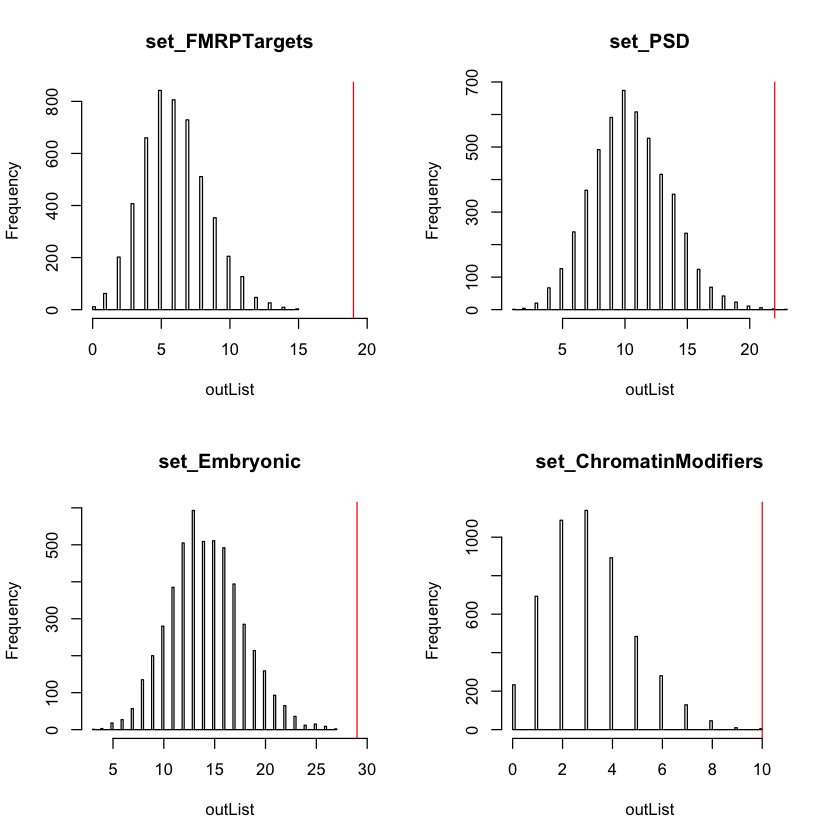

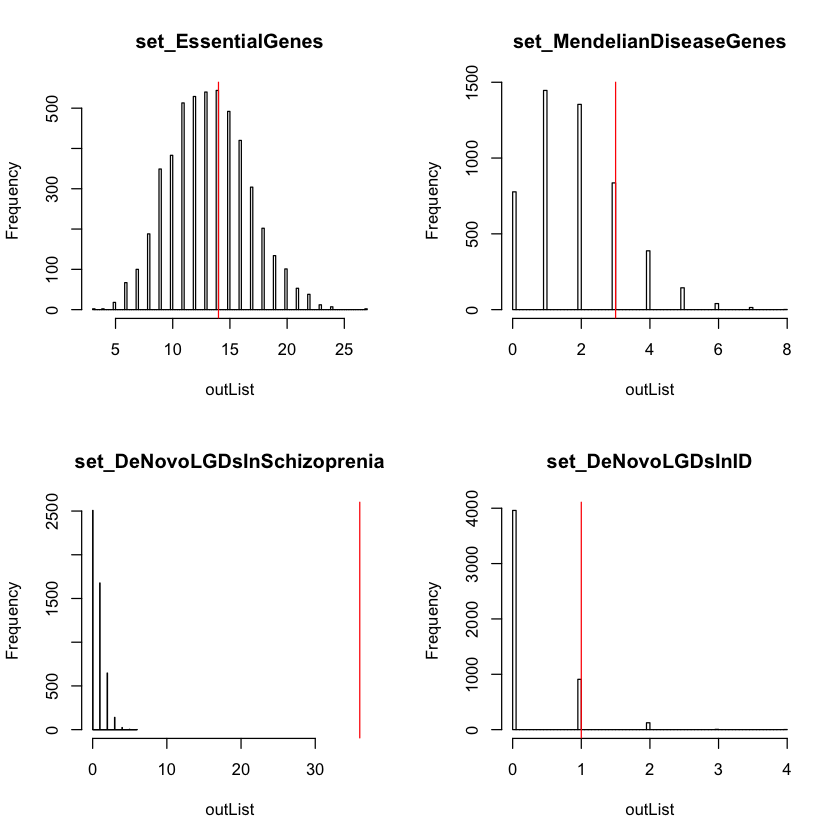

In [58]:
pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL
par(mfrow = c(2, 2))
for (kk in 2:dim(fileTemp)[2]){
#  x1 <- read.table(paste(dirF, "/", fileN[kk], sep = ""))
    xTemp <- fileTemp[, c(1, kk)]
    xTemp <- xTemp[xTemp[, 2] == 1, 1]
  x1 <- as.character(xTemp)
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
    tIndex <- pmatch(xFMRP, xAll)
    tIndex <- tIndex[!is.na(tIndex)]
    xFMRP <- xAll[tIndex]
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- colnames(fileTemp)[kk]
    
  nSample <- 5000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
    
       hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
             #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
   sAll$list108[xIndex] <- 1

        if (length(table(sAll$list108)) > 1)
            pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
}


In [59]:

outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/164, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)

outD <- outD[order(as.numeric(outD[, 2])), ]


In [60]:
outD

gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
set_FMRPTargets,2e-04,19,790,11.59,1.1e-09
set_Embryonic,2e-04,29,1852,17.68,0.00053
set_DeNovoLGDsInSchizoprenia,2e-04,36,93,21.95,1.2e-45
set_PSD,8e-04,22,1376,13.41,0.09
set_ChromatinModifiers,0.0012,10,407,6.1,0.98
set_DeNovoLGDsInID,0.21,1,30,0.61,0.98
set_MendelianDiseaseGenes,0.28,3,241,1.83,1.4e-06
set_EssentialGenes,0.46,14,1722,8.54,2.9e-07
NA,NA,NA,NA,NA,NA


## Gene sets from Schizophrenia Gene Resource http://bioinfo.mc.vanderbilt.edu/SZGR/index.jsp

[1] "160byLewis.gene"              "173byNg.gene"                
[3] "1974GO_neurodevelopment.gene" "75genesByCOR"                
[5] "75genesByCOR.gene"            "coreGeneSet.gene"

gene_set_name,pValue,nOverlappingGene,GeneSetLength,Overlapping Percentage,pAllFDR
1974GO_neurodevelopment.gene,0.0054,25,1831,15.24,0.00095
173byNg.gene,0.37,2,170,1.22,0.41
75genesByCOR.gene,0.43,1,74,0.61,0.28
160byLewis.gene,0.7,1,158,0.61,0.59
75genesByCOR,1,0,0,0,NA
coreGeneSet.gene,1,0,36,0,0.16


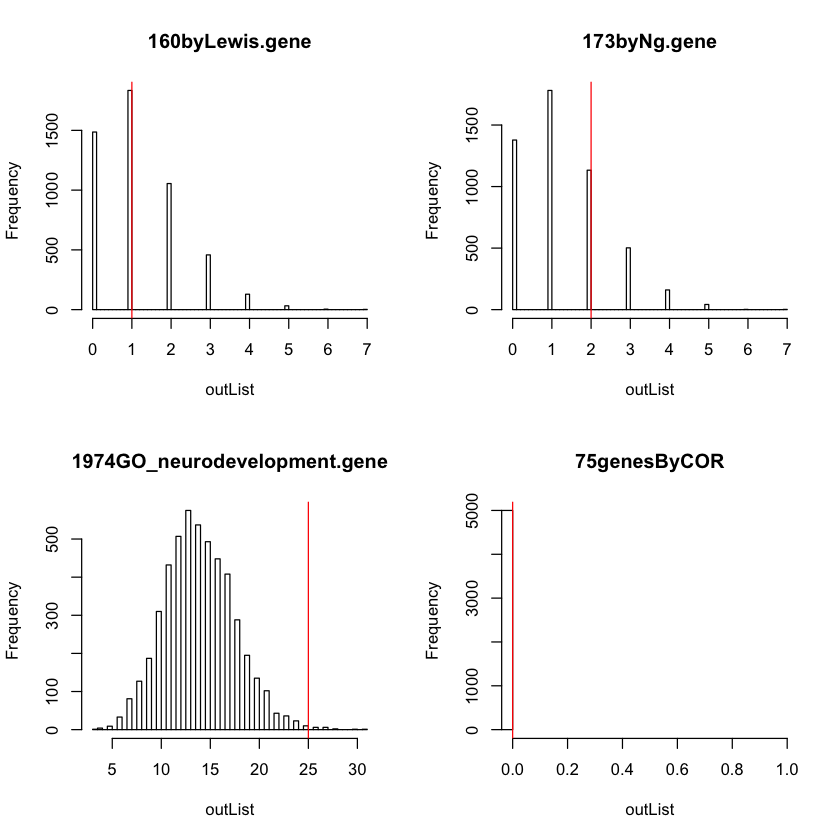

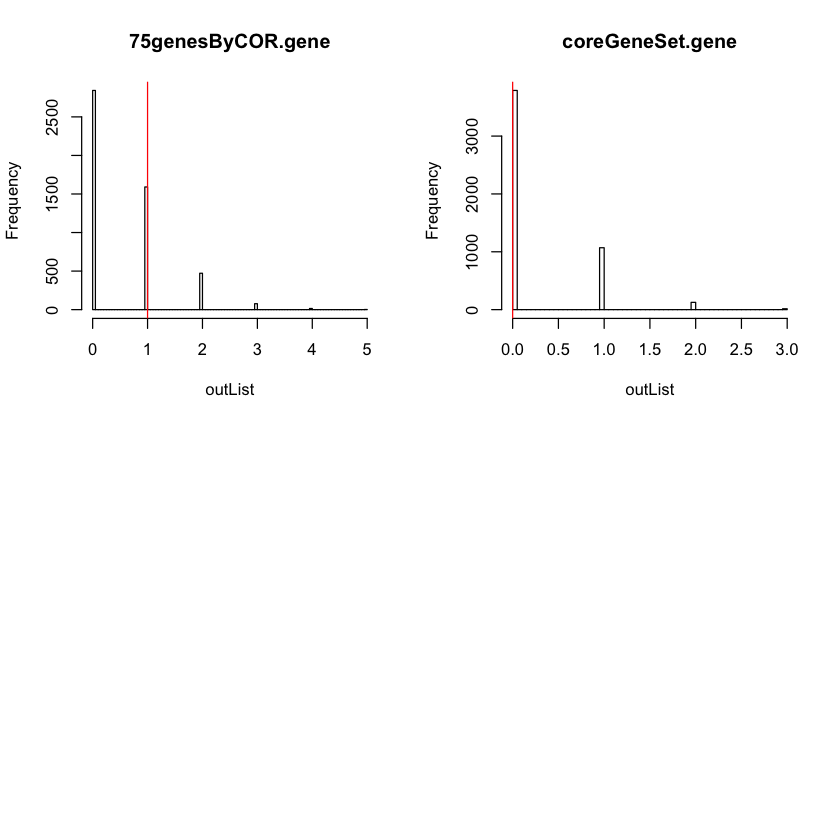

In [66]:
dirF <- "../data/genelists/genesListFromSZGR"

fileN <- dir(dirF, pattern = "gene")
fileN

pList <- NULL
nameGeneSet <- NULL
nOverlappingGene <- NULL
lGeneSet <- NULL
pAllFDR <- NULL
par(mfrow = c(2, 2))
for (kk in 1:length(fileN)){
  x1 <- readLines(paste(dirF, "/", fileN[kk], sep = ""))
  x1 <- as.character(x1)
#  xFMRP <- as.character(x1[, 1])
    xFMRP <- x1
  xFMRP <- unique(xFMRP)
    tIndex <- pmatch(xFMRP, xAll)
    tIndex <- tIndex[!is.na(tIndex)]
    xFMRP <- xAll[tIndex]
  
  l1 <- length(xFMRP)
    lGeneSet[kk] <- l1
  nameGeneSet[kk] <- gsub(".txt", "", fileN[kk])
    
  nSample <- 5000 ##Number of sampling from all genes
  outList <- NULL
  
  xIntersect <- length(intersect(xFMRP, xResult))
  
    nOverlappingGene[kk] <- xIntersect
    
  for (i in 1:nSample){
    tempGene <- sample(xAll, l1)
    outList[i] <- length(intersect(tempGene, xResult))
    
  }
  pList[kk] <- (1 + length(outList[outList >= xIntersect]))/(nSample + 1)
    
       hist(outList, 100, main = nameGeneSet[kk], xlim = range(c(outList, xIntersect + 1)))
    abline(v = xIntersect, col = 'red')
    
             #########TEST all FDRs
    sAll$list108 <- rep(0, dim(sAll)[1])
xIndex <- pmatch(xFMRP, sAll$Gene)
   sAll$list108[xIndex] <- 1

        if (length(table(sAll$list108)) > 1)
            pAllFDR[kk] <- wilcox.test(qvalue ~ as.factor(list108), data = sAll)$p.value
    
  
}

    
outD <- cbind(nameGeneSet, pList, nOverlappingGene, lGeneSet, 100*round(nOverlappingGene/164, 4), pAllFDR)
colnames(outD) <- c("gene_set_name", "pValue", "nOverlappingGene", "GeneSetLength", "Overlapping Percentage", "pAllFDR")
outD[, 2] <- signif(as.numeric(outD[, 2]), 2)
outD[, 6] <- signif(as.numeric(outD[, 6]), 2)

outD <- outD[order(as.numeric(outD[, 2])), ]
outD